<a href="https://colab.research.google.com/github/deelilah/Retail-Transaction-Analysis-/blob/main/Master_Retail_transaction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<!-- PROJECT LOGO -->
<br />
<p align="center">

  <h2 align="center">GROUP PROJECT</h2>

  <p align="center">
    Association Rule Mining
    <br/> Compiled by Delilah,Tamara,Marie
    <br />
    <a href=" "><strong>Check the Presentation »</strong></a>
    <br />
    <br />
    <a href="">View Dataset</a>
    •
    <a href="">Report Issue</a>
    •
    <a href="">LinkedIn</a>
  </p>
</p>

## Assessment Question

### 1. Defining the Question

ABOUT THE DATASET

The dataset contains retail transaction data, which records information about customer purchases in a retail store or online platform. Each row in the dataset represents a single transaction, and the columns provide details about the transaction, such as the items purchased, the total cost, payment method, and whether a discount was applied.


#### Metric for Success

i. Compare two datasets from an open-source repository to explore similarities
and differences in transactional behaviors across industries.

ii. Conduct data preprocessing, exploratory data analysis (EDA), and data
discretization for pattern discovery.

iii. Apply association rule mining and appropriate data mining techniques to
extract business insights.

iv. Discuss the business impact of discovered rules and patterns.


#### c) Understanding the context





**Background**

Retail transaction data provides a wealth of insights into customer purchasing behavior, preferences, and trends. These datasets often include detailed information such as the items purchased, the total amount spent, the payment method used, and any discounts applied. Understanding patterns in such data is crucial for businesses aiming to improve customer experience, optimize inventory, and increase revenue. By comparing transaction datasets across different industries, we can uncover unique and shared behavioral trends, providing a broader perspective on consumer habits and informing strategic decisions.

With the growing availability of open-source transaction data from various sectors—such as groceries, fashion, electronics, and online platforms—there is an opportunity to conduct a comparative analysis that can reveal industry-specific insights and commonalities in consumer behavior.





**Problem** **Statement**

Retailers across different industries often face challenges in understanding and predicting customer behavior due to the complexity and volume of transaction data. While transaction records contain valuable information, the absence of structured analysis limits their potential to inform business strategy.

This project seeks to address this challenge by conducting a comprehensive analysis of two retail transaction datasets from different industries. The analysis will include data preprocessing, exploratory data analysis (EDA), and data discretization. Advanced techniques such as association rule mining will be applied to uncover patterns and correlations within the datasets.

The primary goal is to compare and contrast transactional behaviors across industries and extract actionable insights that can drive business decisions. Ultimately, the project aims to demonstrate how data-driven pattern discovery can enhance customer engagement, sales strategies, and operational efficiency.



#### d) Recording the Experimental Design

Below is the expected flow of our work:

- Data Cleaning and Preparation
    - Load libraries and dataset
    - Deal with missing values
    - Deal with duplicated records
- Perform EDA
    - Univariate Analysis
    - Bivariate Analysis
    - Multivariate Analysis
    
- Association Rule Mining
    - Discretization: Apply relevant discretization techniques and justify choices.
    - Implement FP-Growth or Apriori to extract frequent itemsets and
association rules.
    - Define minimum support and confidence thresholds based on dataset
characteristics.
    - Generate rules with business relevance (e.g., "Customers who buy X also
buy Y").
    - Clustering for segmenting transaction behaviors.
    - Decision trees for rule-based insights.

#### e) Data relevance / Appropriateness of Data

#Transaction Details
Total_Items: The number of items purchased in the transaction.

Total_Cost: The total amount spent in the transaction (in dollars or another currency).

Customer Information:
Customer_ID: A unique identifier for the customer making the purchase.

Customer_Segment: (If available) The category or segment the customer belongs to (e.g., "Frequent Buyer," "New Customer").

Product Information:
Product_ID: A unique identifier for the product purchased.

Product_Category: (If available) The category of the product (e.g., "Electronics," "Clothing").

Payment and Discount Information:
Payment_Method: The method used to pay for the transaction (e.g., "Credit Card," "Cash," "PayPal").

Discount_Applied: Indicates whether a discount was applied to the transaction (e.g., "Yes" or "No").

Discount_Amount: (If available) The amount of discount applied to the transaction.

Additional Details:
Store_ID: (If available) The identifier for the store where the transaction occurred.

Region: (If available) The geographic region where the transaction took place.



Identify product combinations frequently purchased together to optimize store layout, promotions, and cross-selling opportunities in a retail store.

### Importing Libraries

In [ ]:
#Importing libraries we will use for data manipulation and visualization
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')

### 2. Reading the Data

In [ ]:

# Loading our dataset
retail = pd.read_csv('/content/Retail_Transactions_Dataset.csv')
retail

,Transaction_ID,Date,Customer_Name,Product,Total_Items,Total_Cost,Payment_Method,City,Store_Type,Discount_Applied,Customer_Category,Season,Promotion
0,1000000000,2022-01-21 06:27:29,Stacey Price,"['Ketchup', 'Shaving Cream', 'Light Bulbs']",3,71.65,Mobile Payment,Los Angeles,Warehouse Club,True,Homemaker,Winter,NaN
1,1000000001,2023-03-01 13:01:21,Michelle Carlson,"['Ice Cream', 'Milk', 'Olive Oil', 'Bread', 'P...",2,25.93,Cash,San Francisco,Specialty Store,True,Professional,Fall,BOGO (Buy One Get One)
2,1000000002,2024-03-21 15:37:04,Lisa Graves,['Spinach'],6,41.49,Credit Card,Houston,Department Store,True,Professional,Winter,NaN
3,1000000003,2020-10-31 09:59:47,Mrs. Patricia May,"['Tissues', 'Mustard']",1,39.34,Mobile Payment,Chicago,Pharmacy,True,Homemaker,Spring,NaN
4,1000000004,2020-12-10 00:59:59,Susan Mitchell,['Dish Soap'],10,16.42,Debit Card,Houston,Specialty Store,False,Young Adult,Winter,Discount on Selected Items
...,...,...,...,...,...,...,...,...,...,...,...,...,...
999995,1000999995,2023-03-27 06:12:10,Lisa Gonzalez,"['Pickles', 'Carrots', 'Peanut Butter', 'Spong...",1,22.07,Debit Card,Los Angeles,Supermarket,False,Middle-Aged,Winter,NaN
999996,1000999996,2022-05-19 05:13:58,Emily Graham,['Cereal'],8,80.25,Cash,Houston,Warehouse Club,True,Senior Citizen,Spring,Discount on Selected Items
999997,1000999997,2021-09-03 13:59:39,Cynthia Anderson,['Trash Bags'],3,60.74,Credit Card,Los Angeles,Convenience Store,False,Homemaker,Winter,NaN
999998,1000999998,2023-10-17 05:50:40,Michael Rodriguez,"['Diapers', 'Coffee', 'Coffee', 'Mop']",3,23.48,Debit Card,San Francisco,Supermarket,True,Retiree,Winter,BOGO (Buy One Get One)


#### Data Cleaning

In [ ]:
## removing duplicates from data
item0 = retail.shape[0]  # Stores the initial number of rows in the DataFrame
retail = retail.drop_duplicates()  # Removes duplicate rows from the DataFrame
item1 = retail.shape[0]  # Stores the number of rows after removing duplicates
print(f"There are {item0-item1} duplicates found in the dataset")  # Prints the number of duplicates that were removed

There are 0 duplicates found in the dataset


In [ ]:

# Checking the number of columns and rows
retail.shape

(1000000, 13)

Later Variables used for EDA

In [ ]:
#drop columns Payment_Method,City,Store_Type,Discount_Applied,Customer_Category,Season,Promotion
#should be used for analysis
# Assuming your DataFrame is named 'retail'
columns_to_drop = ['Payment_Method', 'City', 'Store_Type', 'Discount_Applied', 'Customer_Category', 'Season', 'Promotion','Customer_Name']
retail_new = retail.drop(columns=columns_to_drop, errors='ignore')


In [ ]:
retail_new.head()

,Transaction_ID,Date,Product,Total_Items,Total_Cost
0,1000000000,2022-01-21 06:27:29,"['Ketchup', 'Shaving Cream', 'Light Bulbs']",3,71.65
1,1000000001,2023-03-01 13:01:21,"['Ice Cream', 'Milk', 'Olive Oil', 'Bread', 'P...",2,25.93
2,1000000002,2024-03-21 15:37:04,['Spinach'],6,41.49
3,1000000003,2020-10-31 09:59:47,"['Tissues', 'Mustard']",1,39.34
4,1000000004,2020-12-10 00:59:59,['Dish Soap'],10,16.42


In [ ]:
retail_new.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000000 entries, 0 to 999999
Data columns (total 5 columns):
 #   Column          Non-Null Count    Dtype  
---  ------          --------------    -----  
 0   Transaction_ID  1000000 non-null  int64  
 1   Date            1000000 non-null  object 
 2   Product         1000000 non-null  object 
 3   Total_Items     1000000 non-null  int64  
 4   Total_Cost      1000000 non-null  float64
dtypes: float64(1), int64(2), object(2)
memory usage: 38.1+ MB


In [ ]:
retail_new['Product'].value_counts()


,count
Product,
['Toothpaste'],4893
['Deodorant'],2541
['Honey'],2540
['Eggs'],2515
['Olive Oil'],2505
...,...
"['Pasta', 'Extension Cords', 'Ironing Board']",1
"['Onions', 'Carrots', 'Dishware', 'Shower Gel']",1
"['Yogurt', 'Cheese', 'Ketchup', 'Tissues']",1


Data Visualization: Exploratory Analysis done in R



Data Modelling

In [ ]:
!pip install ace_tools

Transform the variable product into a List for modelling

In [ ]:
import ast

def safe_literal_eval(x):
    try:
        return ast.literal_eval(x)
    except (SyntaxError, ValueError):
        # If ast.literal_eval fails, attempt to handle it (e.g., return the original string)
        return x

retail_new['Product'] = retail_new['Product'].apply(safe_literal_eval)
retail_new

,Transaction_ID,Date,Product,Total_Items,Total_Cost
0,1000000000,2022-01-21 06:27:29,"[Ketchup, Shaving Cream, Light Bulbs]",3,71.65
1,1000000001,2023-03-01 13:01:21,"[Ice Cream, Milk, Olive Oil, Bread, Potatoes]",2,25.93
2,1000000002,2024-03-21 15:37:04,[Spinach],6,41.49
3,1000000003,2020-10-31 09:59:47,"[Tissues, Mustard]",1,39.34
4,1000000004,2020-12-10 00:59:59,[Dish Soap],10,16.42
...,...,...,...,...,...
999995,1000999995,2023-03-27 06:12:10,"[Pickles, Carrots, Peanut Butter, Sponges, BBQ...",1,22.07
999996,1000999996,2022-05-19 05:13:58,[Cereal],8,80.25
999997,1000999997,2021-09-03 13:59:39,[Trash Bags],3,60.74
999998,1000999998,2023-10-17 05:50:40,"[Diapers, Coffee, Coffee, Mop]",3,23.48


Convert text data to 0/1 for applying the algorithms

In [ ]:

# One-hot encode the product list into transaction format
# Each row: a transaction; each column: a product
from mlxtend.preprocessing import TransactionEncoder

# Extract product lists
transactions = retail_new['Product'].tolist()

# Transform using TransactionEncoder
te = TransactionEncoder()
te_ary = te.fit(transactions).transform(transactions)

# Create a one-hot encoded DataFrame
df_encoded = pd.DataFrame(te_ary, columns=te.columns_)

# Now df_encoded is ready for market basket analysis
df_encoded

,Air Freshener,Apple,BBQ Sauce,Baby Wipes,Banana,Bath Towels,Beef,Bread,Broom,Butter,...,Tomatoes,Toothbrush,Toothpaste,Trash Bags,Trash Cans,Tuna,Vacuum Cleaner,Vinegar,Water,Yogurt
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,True,False,False,...,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
999995,False,False,True,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
999996,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
999997,False,False,False,False,False,False,False,False,False,False,...,False,False,False,True,False,False,False,False,False,False
999998,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [ ]:
print(f"Number of transactions: {len(df_encoded)}")


Number of transactions: 1000000


In [ ]:
df_encoded.iloc[0]


,0
Air Freshener,False
Apple,False
BBQ Sauce,False
Baby Wipes,False
Banana,False
...,...
Tuna,False
Vacuum Cleaner,False
Vinegar,False
Water,False


In [ ]:
df_encoded['Total_Amount_Binned'] = pd.cut(df_encoded['Total_Cost'], bins=5, labels=['Very Low', 'Low', 'Medium', 'High', 'Very High'])

print(df_encoded[['Total_Cost', 'Total_Amount_Binned']].head()) # Print with 'Total_Cost'

KeyError: 'Total_Cost'

In [ ]:
# # #Ensure the column is added to the existing retail_1 dataframe
df_encoded['Total_Cost_Categories'] = pd.cut(
    df_encoded['Total_Cost'],
    bins=5,
    labels=['Very Low', 'Low', 'Medium', 'High', 'Very High']
)

# Instead of using 'tools', display the dataframe directly using pandas:
display(df_encoded.head())

#APRIORI ALGORITHM

Identifying Frequent Patterns in the data using Apriori

In [ ]:
from mlxtend.frequent_patterns import apriori, association_rules

# Generate frequent itemsets
frequent_items = apriori(df_encoded, min_support=0.01, use_colnames=True)
print(frequent_items.head())




    support         itemsets
0  0.036266  (Air Freshener)
1  0.035748          (Apple)
2  0.036046      (BBQ Sauce)
3  0.036196     (Baby Wipes)
4  0.036224         (Banana)


In [ ]:
# Generate rules
rules = association_rules(frequent_items, metric="lift", min_threshold=1.0)
rules

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski


Generate frequent itemsets with low enough support


In [ ]:
from mlxtend.frequent_patterns import apriori, association_rules

# Generate frequent itemsets with low enough support
frequent_items = apriori(df_encoded, min_support=0.01, use_colnames=True)

# If we found any, generate association rules
if not frequent_items.empty:
    rules = association_rules(frequent_items, metric="confidence", min_threshold=0.1)

    # Optional: Sort by lift or confidence
    rules = rules.sort_values(by='lift', ascending=False)

    # Preview rules
    print(rules[['antecedents', 'consequents', 'support', 'confidence', 'lift']].head())
else:
    print("No frequent itemsets found. Try lowering min_support again.")


Empty DataFrame
Columns: [antecedents, consequents, support, confidence, lift]
Index: []


In [ ]:
def make_readable_rule(row):
    antecedent = ', '.join(list(row['antecedents']))
    consequent = ', '.join(list(row['consequents']))
    confidence = round(row['confidence'] * 100, 2)
    lift = round(row['lift'], 2)
    return f"🛒 Customers who buy **{antecedent}** also tend to buy **{consequent}** (confidence: {confidence}%, lift: {lift})"

# Apply to the top N rules
top_rules = rules.head(10)  # or any N
business_rules = top_rules.apply(make_readable_rule, axis=1)

# Display
for rule in business_rules:
    print(rule)


antecedents
consequents
antecedent support
consequent support
support
confidence
lift
representativity
leverage
conviction
zhangs_metric
jaccard
certainty
kulczynski


#Visualize Apriori to look for rules

In [ ]:
pip install mlxtend matplotlib seaborn networkx


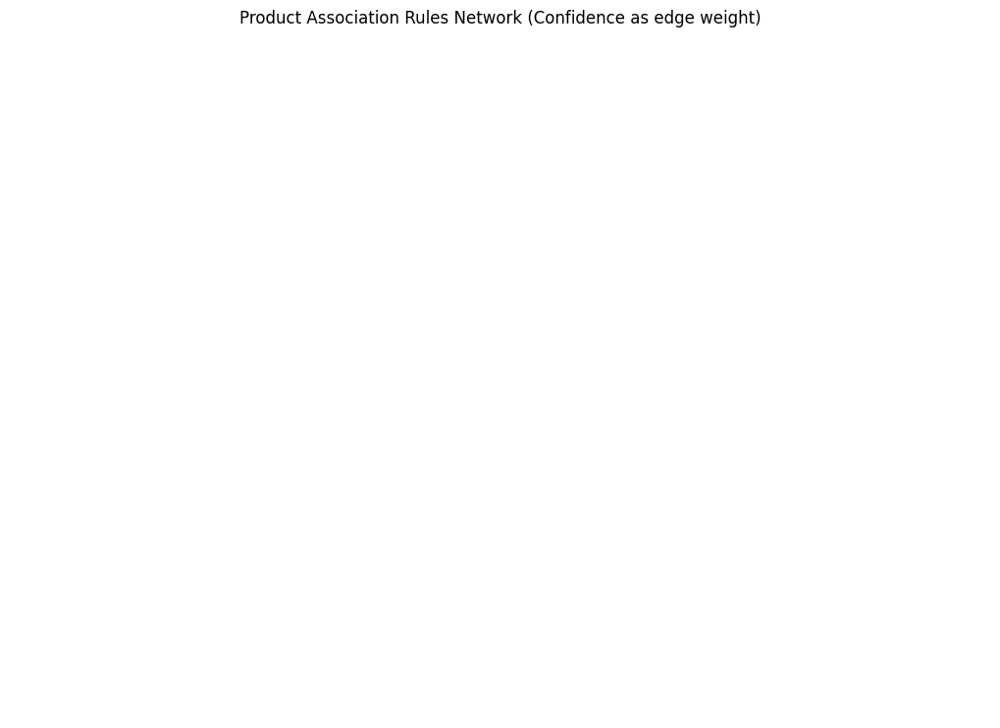

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt

# Create a directed graph
G = nx.DiGraph()

# Add nodes and edges from top N rules
top_rules = rules.head(10)

for _, row in top_rules.iterrows():
    for ant in row['antecedents']:
        for con in row['consequents']:
            G.add_edge(ant, con, weight=row['confidence'])

plt.figure(figsize=(10, 7))
pos = nx.spring_layout(G, k=0.5)
nx.draw(G, pos, with_labels=True, node_color='lightblue', node_size=2000, font_size=10, font_weight='bold', arrows=True)
edge_labels = {(u, v): f"{d['weight']:.2f}" for u, v, d in G.edges(data=True)}
nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels)
plt.title("Product Association Rules Network (Confidence as edge weight)")
plt.show()


In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# ... (Your previous code for generating association rules)

# Check if rules DataFrame is empty
if rules.empty:
    print("No association rules found. Cannot generate heatmap.")
else:
    # Extract top rules (only if rules exist)
    top_rules = rules.head(10).copy()

    # Create a grid of antecedents vs consequents
    top_rules['antecedents'] = top_rules['antecedents'].apply(lambda x: ', '.join(list(x)))
    top_rules['consequents'] = top_rules['consequents'].apply(lambda x: ', '.join(list(x)))

    # Pivot for heatmap
    heatmap_data = top_rules.pivot(index='antecedents', columns='consequents', values='lift')

    # Check if heatmap_data is valid before plotting
    if heatmap_data.empty:
        print("Heatmap data is empty. Cannot generate heatmap. Check your association rules and data.")
    else:
        # Plot the heatmap
        plt.figure(figsize=(10, 6))
        sns.heatmap(heatmap_data, annot=True, cmap="YlGnBu", fmt=".2f")
        plt.title("Lift Heatmap of Association Rules")
        plt.ylabel("Antecedents")
        plt.xlabel("Consequents")
        plt.xticks(rotation=45)
        plt.yticks(rotation=0)
        plt.tight_layout()
        plt.show()


No association rules found. Cannot generate heatmap.


Apriori Gave No Rules
Support threshold was lowered but still didnt produce any rules.

Apriori generates candidate itemsets and prunes aggressively. If your support threshold is even slightly high, it might not generate any frequent itemsets.

Sparse data
If most items don’t co-occur often enough, Apriori might discard all combinations.

Inefficient scaling
On large datasets, Apriori is slower and may timeout or run out of memory before generating itemsets as the data is also large.


# FP Growth Algorithm

In [ ]:
!pip install pyfpgrowth


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 27.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pyfpgrowth: filename=pyfpgrowth-1.0-py2.py3-none-any.whl size=5489 sha256=a0245f132a9794246d8f16c1db416d8d5d93604b707ae29908a3b2360631e76b
  Stored in directory: /root/.cache/pip/wheels/f2/cf/03/d025f5c38b5e9cfbbe5e68ec539c2bf8dee7a9f8ee14629e2d
Successfully built pyfpgrowth


FP GROWTH ALGORITHM ON FULL DATASET

In [ ]:
import pyfpgrowth

# Find frequent patterns with min support of 2 transactions
patterns = pyfpgrowth.find_frequent_patterns(transactions, 2)
rules = pyfpgrowth.generate_association_rules(patterns, 0.7)

print("Patterns:", patterns)
print("Rules:", rules)


Patterns: {('Trash Bags', 'Trash Bags', 'Trash Bags'): 2, ('Shaving Cream', 'Trash Bags', 'Trash Bags'): 8, ('Ironing Board', 'Trash Bags', 'Trash Bags'): 10, ('Ironing Board', 'Trash Bags', 'Trash Bags', 'Vinegar'): 2, ('Cleaning Spray', 'Trash Bags', 'Trash Bags'): 10, ('Butter', 'Shower Gel', 'Trash Bags', 'Trash Bags'): 2, ('Butter', 'Cereal', 'Trash Bags', 'Trash Bags'): 2, ('Butter', 'Chips', 'Trash Bags', 'Trash Bags'): 2, ('Bath Towels', 'Butter', 'Trash Bags', 'Trash Bags'): 2, ('Sponges', 'Trash Bags', 'Trash Bags'): 10, ('Sponges', 'Trash Bags', 'Trash Bags', 'Water'): 2, ('Air Freshener', 'Trash Bags', 'Trash Bags'): 11, ('Mayonnaise', 'Trash Bags', 'Trash Bags'): 11, ('Mayonnaise', 'Toothpaste', 'Trash Bags', 'Trash Bags'): 2, ('Orange', 'Trash Bags', 'Trash Bags'): 11, ('Eggs', 'Orange', 'Trash Bags', 'Trash Bags'): 2, ('Mustard', 'Trash Bags', 'Trash Bags'): 11, ('Mustard', 'Tea', 'Trash Bags', 'Trash Bags'): 2, ('Baby Wipes', 'Canned Soup', 'Trash Bags', 'Trash Bags'): 

Minimized sample to 50 transactions for better visualization and minimal run time



FP GROWTH Visualization with 50 rules




In [ ]:

# #import networkx as nx
# import matplotlib.pyplot as plt

# # 6. Visualize ONLY the first 50 Rules
# G = nx.DiGraph()

# # Limit to first 1000 rules
# limited_rules = dict(list(rules.items())[:50])

# for antecedent, consequent_confidence in limited_rules.items():
#     consequent, confidence = consequent_confidence

#     antecedent_str = ', '.join(list(antecedent))
#     consequent_str = ', '.join(list(consequent))
#     G.add_edge(antecedent_str, consequent_str, weight=confidence)

# # Draw the graph
# plt.figure(figsize=(12, 10))
# pos = nx.spring_layout(G, seed=7)
# edge_labels = nx.get_edge_attributes(G, 'weight')

# nx.draw(
#     G, pos, with_labels=True, node_size=2000,
#     node_color='lightblue', font_size=9, font_weight='bold', arrows=True
# )

# nx.draw_networkx_edge_labels(
#     G, pos,
#     edge_labels={(k[0], k[1]): f"{v:.2f}" for k, v in edge_labels.items()},
#     font_color='red'
# )

# plt.title("FP-Growth Association Rules (First 50 Rules)")
# plt.show()


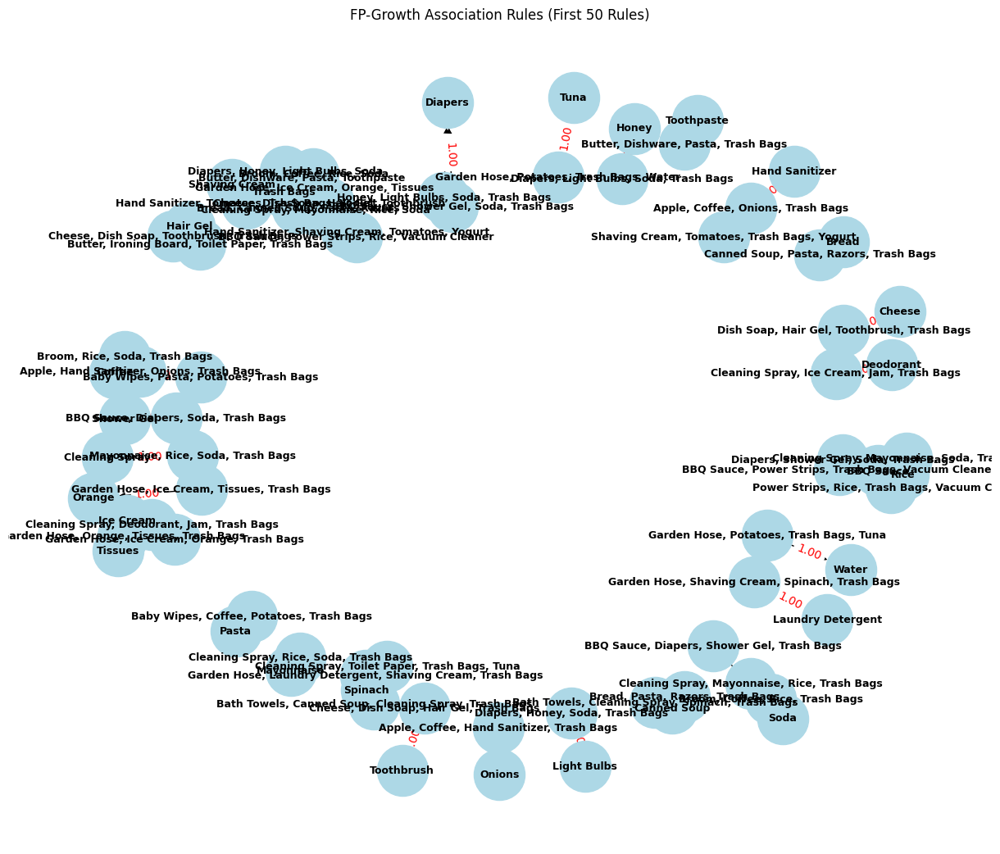

In [ ]:
#import networkx as nx
import matplotlib.pyplot as plt

# 6. Visualize ONLY the first 50 Rules
G = nx.DiGraph()

# Limit to first 1000 rules
limited_rules = dict(list(rules.items())[:50])

for antecedent, consequent_confidence in limited_rules.items():
    # Check if consequent_confidence has enough values to unpack
    if isinstance(consequent_confidence, (tuple, list)) and len(consequent_confidence) >= 2:
        consequent, confidence = consequent_confidence
    else:
        # Handle cases where unpacking is not possible (e.g., print a message or skip)
        print(f"Skipping rule with antecedent: {antecedent} due to insufficient values in consequent_confidence")
        continue  # Skip to the next iteration of the loop

    antecedent_str = ', '.join(list(antecedent))
    consequent_str = ', '.join(list(consequent))
    G.add_edge(antecedent_str, consequent_str, weight=confidence)

# Draw the graph
plt.figure(figsize=(12, 10))
pos = nx.spring_layout(G, seed=7)
edge_labels = nx.get_edge_attributes(G, 'weight')

nx.draw(
    G, pos, with_labels=True, node_size=2000,
    node_color='lightblue', font_size=9, font_weight='bold', arrows=True
)

nx.draw_networkx_edge_labels(
    G, pos,
    edge_labels={(k[0], k[1]): f"{v:.2f}" for k, v in edge_labels.items()},
    font_color='red'
)

plt.title("FP-Growth Association Rules (First 50 Rules)")
plt.show()

if you see:

diapers → trash bags, tuna (1.00)

this means:
every time diapers appeared in your 50-sample dataset, it was always bought with trash bags and tuna — i.e., a confidence of 100%.



Interpretation

Heatmap

Our dataset had no rules despite tweeking the support

Clustering for segmenting transaction behaviors.




In [ ]:
pip install scikit-learn matplotlib seaborn


KMEANS CLUSTERING

In [ ]:
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns

# Run KMeans
k = 4  # choose number of clusters (you can tune this)
kmeans = KMeans(n_clusters=k, random_state=42)
clusters = kmeans.fit_predict(df_encoded)

# Add cluster labels to the original DataFrame
df_encoded['Cluster'] = clusters


Visualize PCA

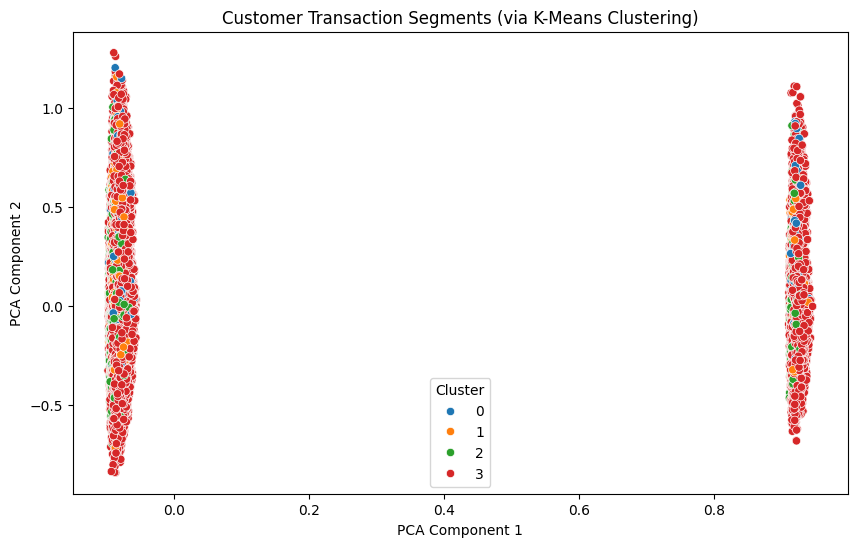

In [ ]:
# Reduce to 2D for plotting
pca = PCA(n_components=2)
components = pca.fit_transform(df_encoded.drop('Cluster', axis=1))

# Plot
plt.figure(figsize=(10, 6))
sns.scatterplot(x=components[:, 0], y=components[:, 1], hue=clusters, palette='tab10')
plt.title("Customer Transaction Segments (via K-Means Clustering)")
plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")
plt.legend(title="Cluster")
plt.show()


Interprete Output

In [ ]:
# Drop PCA columns if added
segment_profiles = df_encoded.groupby('Cluster').mean()

# Transpose for readability
segment_profiles.T


Cluster,0,1,2,3
Air Freshener,0.033575,0.032811,0.031952,0.037134
Apple,0.032988,0.032905,0.031645,0.036555
BBQ Sauce,0.031559,0.032531,0.032142,0.037033
Baby Wipes,0.032130,0.034228,0.031893,0.037058
Banana,0.031453,0.033995,0.033195,0.037057
...,...,...,...,...
Tuna,0.032853,0.031830,0.032669,0.036817
Vacuum Cleaner,0.032386,0.032282,0.032464,0.036866
Vinegar,0.031167,0.033450,0.033108,0.036624
Water,0.031784,0.033948,0.032186,0.036421


Decision trees for rule-based insights.

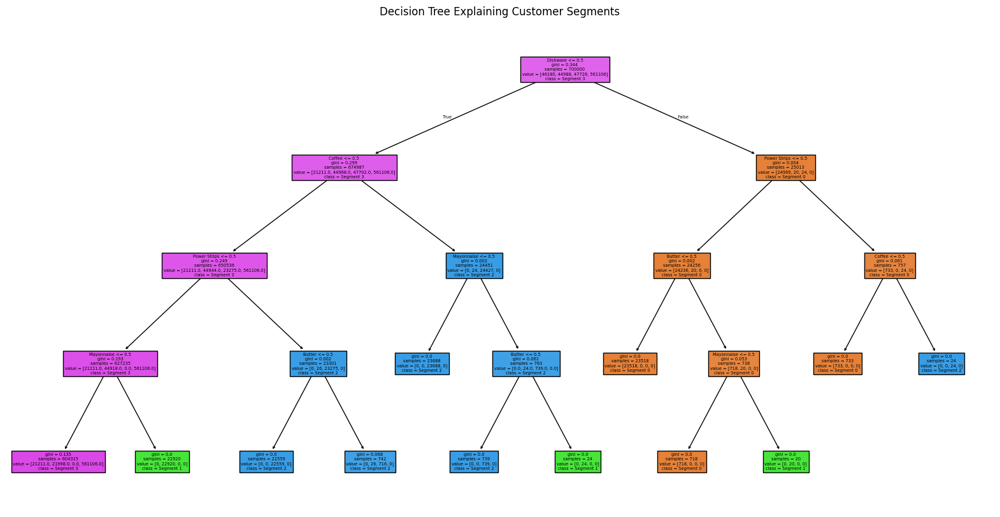

In [ ]:
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

# Features and target
X = df_encoded.drop('Cluster', axis=1)
y = df_encoded['Cluster']

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Train Decision Tree
clf = DecisionTreeClassifier(max_depth=4, random_state=42)
clf.fit(X_train, y_train)

# Plot Tree
plt.figure(figsize=(20, 10))
plot_tree(clf, feature_names=X.columns, class_names=[f"Segment {i}" for i in clf.classes_], filled=True)
plt.title("Decision Tree Explaining Customer Segments")
plt.show()


Using Decision Trees to Predict Product Purchase (e.g., "Butter")

---





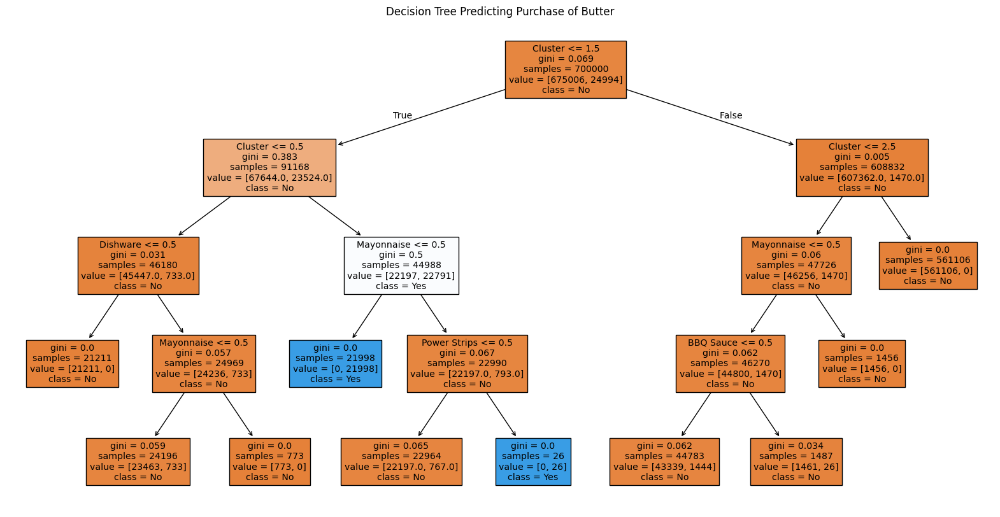

In [ ]:
# Choose target product
target_product = 'Butter'

# Features and target
X = df_encoded.drop(columns=[target_product])
y = df_encoded[target_product]

# Split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Train
clf = DecisionTreeClassifier(max_depth=4, random_state=42)
clf.fit(X_train, y_train)

# Plot
plt.figure(figsize=(20, 10))
plot_tree(clf, feature_names=X.columns, class_names=['No', 'Yes'], filled=True)
plt.title(f"Decision Tree Predicting Purchase of {target_product}")
plt.show()




```
# This is formatted as code
```

Extracting Rules (Text Format)


In [ ]:
from sklearn.tree import export_text

tree_rules = export_text(clf, feature_names=list(X.columns))
print(tree_rules)


|--- Cluster <= 1.50
|   |--- Cluster <= 0.50
|   |   |--- Dishware <= 0.50
|   |   |   |--- class: False
|   |   |--- Dishware >  0.50
|   |   |   |--- Mayonnaise <= 0.50
|   |   |   |   |--- class: False
|   |   |   |--- Mayonnaise >  0.50
|   |   |   |   |--- class: False
|   |--- Cluster >  0.50
|   |   |--- Mayonnaise <= 0.50
|   |   |   |--- class: True
|   |   |--- Mayonnaise >  0.50
|   |   |   |--- Power Strips <= 0.50
|   |   |   |   |--- class: False
|   |   |   |--- Power Strips >  0.50
|   |   |   |   |--- class: True
|--- Cluster >  1.50
|   |--- Cluster <= 2.50
|   |   |--- Mayonnaise <= 0.50
|   |   |   |--- BBQ Sauce <= 0.50
|   |   |   |   |--- class: False
|   |   |   |--- BBQ Sauce >  0.50
|   |   |   |   |--- class: False
|   |   |--- Mayonnaise >  0.50
|   |   |   |--- class: False
|   |--- Cluster >  2.50
|   |   |--- class: False



In [ ]:
!pip install PyARMViz


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 658.2/658.2 kB 19.4 MB/s eta 0:00:00


Clusters around 1 (Cluster between 0.5 and 1.5) seem to include customers who are more likely to buy (under certain conditions).

Customers with Mayonnaise and Light Bulbs in their basket (within cluster 1) are more likely to purchase the predicted item.

High cluster values (above 2.5) are not associated with purchases.

Products like Mayonnaise, Light Bulbs, and Onions influence the buying behavior.




**DISCRETIZATION**



In [ ]:
# #Apply equal-width binning to 'Total_Amount'
# retail_1['Total_Amount_Binned'] = pd.cut(retail_1['Total_Cost'], bins=5, labels=['Very Low', 'Low', 'Medium', 'High', 'Very High'])

# print(retail_1[['Total_Cost', 'Total_Amount_Binned']].head())

In [ ]:
# # #Ensure the column is added to the existing retail_1 dataframe
# retail1['Total_Cost_Categories'] = pd.cut(
#     retail1['Total_Cost'],
#     bins=5,
#     labels=['Very Low', 'Low', 'Medium', 'High', 'Very High']
# )

# # Instead of using 'tools', display the dataframe directly using pandas:
# display(retail1.head())


Choosing the Best Method for Your Use Case

*   For Market Basket Analysis (MBA) → K-Means or Equal-Frequency Binning
*   For Predicting Customer Spending Behavior → Decision Tree Binning
*   For General Trend Analysis & Reports → Equal-Width or Custom Binning





In [ ]:
# # Group by Transaction_ID and aggregate Product into lists
# basket_list = retail1.groupby('Transaction_ID')['Product'].apply(list).reset_index()

# display(basket_list)

In [ ]:
# def encode(x):
#    if x == 0:
#        return False
#    if x > 0:
#        return True

# basket_encode = retail1.applymap(encode)

In [ ]:
# import ast

# def safe_literal_eval(x):
#     try:
#         # Attempt to evaluate as a literal
#         return ast.literal_eval(x)
#     except (SyntaxError, ValueError):
#         # If it's not a valid literal, try to handle it as a string
#         if isinstance(x, str):
#             # Remove extra characters and split if needed
#             x = x.strip("[]").replace("'", "").split(", ")
#             # Adjust this logic based on the actual format of your strings
#         return x

# basket_list['Product'] = basket_list['Product'].apply(safe_literal_eval)

# # Explode the 'Product' column
# basket_list = basket_list.explode('Product')

# # Strip spaces and remove unwanted characters if necessary
# basket_list['Product'] = basket_list['Product'].str.strip()



In [ ]:
# from mlxtend.frequent_patterns import apriori, association_rules

# # Convert into basket format (one-hot encoding)
# basket = retail1.pivot_table(index='Transaction_ID',
#                         columns='Product',
#                         values='Total_Items',
#                         aggfunc='sum',
#                         fill_value=0)

# # Convert to 1/0 format (Presence/Absence)
# basket = basket.applymap(lambda x: 1 if x > 0 else 0)

# # Display the transformed dataset
# display(basket.head())


In [ ]:
# import pandas as pd
# from sklearn.preprocessing import StandardScaler

# # Load the dataset (Replace 'df' with your actual dataset)
# df = retail1  # Your dataset

# # Aggregate transaction behaviors per customer
# customer_data = df.groupby('Transaction_ID').agg({
#     'Total_Cost': 'sum',         # Total amount spent
#     'Total_Items': 'sum',        # Total items purchased
#     'Product': lambda x: len(set(x))  # Unique products bought
# }).reset_index()

# # Rename columns
# customer_data.columns = ['Transaction_ID', 'Total_Spent', 'Total_Items', 'Unique_Products']

# # Normalize the numerical columns
# scaler = StandardScaler()
# customer_data[['Total_Spent', 'Total_Items', 'Unique_Products']] = scaler.fit_transform(customer_data[['Total_Spent', 'Total_Items', 'Unique_Products']])

# # Display processed data
# import ace_tools as tools
# tools.display_dataframe_to_user(name="Processed Customer Data", dataframe=customer_data)


In [ ]:
# # Apply Apriori Algorithm to find frequent itemsets
# frequent_itemsets = apriori(basket,
#                             min_support=0.02,  # Adjust as needed
#                             use_colnames=True)

# # Generate Association Rules
# rules = association_rules(frequent_itemsets,
#                           metric="lift",
#                           min_threshold=1.0)

# # Display results
# tools.display_dataframe_to_user(name="Market Basket Rules", dataframe=rules)


In [ ]:
# import pandas as pd
# import ast
# from mlxtend.frequent_patterns import apriori, fpgrowth, association_rules
# from mlxtend.preprocessing import TransactionEncoder

# # Convert the 'Product' column from string representation of list to an actual list
# retail_2['Product'] = retail_2['Product'].apply(ast.literal_eval)

# # Create a list of transactions (each transaction is a list of items)
# transactions = retail_2['Product'].tolist()


In [ ]:
# # Convert transactions into one-hot encoded DataFrame
# te = TransactionEncoder()
# te_ary = te.fit(transactions).transform(transactions)
# df_encoded = pd.DataFrame(te_ary, columns=te.columns_)


In [ ]:
# # Apply Apriori algorithm to extract frequent itemsets
# frequent_itemsets_apriori = apriori(df_encoded, min_support=0.05, use_colnames=True)

# # Apply FP-Growth algorithm to extract frequent itemsets
# frequent_itemsets_fpgrowth = fpgrowth(df_encoded, min_support=0.05, use_colnames=True)

# # Generate association rules from Apriori results
# rules_apriori = association_rules(frequent_itemsets_apriori, metric="lift", min_threshold=1.0)

# # Generate association rules from FP-Growth results
# rules_fpgrowth = association_rules(frequent_itemsets_fpgrowth, metric="lift", min_threshold=1.0)


In [ ]:

# # Display results
# print("Frequent Itemsets (Apriori):\n", frequent_itemsets_apriori)
# print("\nFrequent Itemsets (FP-Growth):\n", frequent_itemsets_fpgrowth)
# print("\nAssociation Rules (Apriori):\n", rules_apriori)
# print("\nAssociation Rules (FP-Growth):\n", rules_fpgrowth)

1. Minimum Support (min_support)
Support = (Number of transactions containing an itemset) / (Total transactions)
The threshold should balance frequent patterns while avoiding excessive noise.
A good starting point is 5% (0.05), meaning an itemset must appear in at least 5% of all transactions to be considered frequent.
If the dataset is large and diverse, use a lower support (e.g., 1-3%).
If the dataset is small, use a higher support (e.g., 5-10%).

2. Minimum Confidence (min_confidence)
Confidence = (Support of itemset) / (Support of antecedent)
Represents the likelihood that if a customer buys X, they also buy Y.
A common range is 50-70% (0.5 - 0.7):
Higher confidence (e.g., 70%) → More reliable rules but may exclude useful associations.
Lower confidence (e.g., 50%) → More rules but potentially less significant.

3. Minimum Lift (min_lift)
Lift > 1 indicates that the association rule is stronger than chance.
A good rule of thumb: Lift > 1.2 ensures meaningful insights.

In [ ]:
# #we are going to use the Chicago
# MBA_df = choose_country(country="Chicago")
# MBA_df.head()

,Customer_Name,Product,Total_Items,Total_Cost,Payment_Method,City,Store_Type,Discount_Applied,Customer_Category,Season,Year,Month,Day,Total_Amount_Binned,Total_Cost_Quantile
0,Mrs. Patricia May,"['Tissues', 'Mustard']",1,39.34,Mobile Payment,Chicago,Pharmacy,True,Homemaker,Spring,2020,10,31 09:59:47,1,Q2
1,Sydney Waller,"['Syrup', 'Trash Cans', 'Pancake Mix', 'Water'...",5,21.77,Debit Card,Chicago,Specialty Store,False,Young Adult,Winter,2020,9,03 12:39:59,0,Q1
2,Charles Brooks,['Coffee'],7,96.77,Debit Card,Chicago,Department Store,True,Homemaker,Winter,2021,1,31 07:52:18,2,Q4
3,Robert Gilbert DDS,"['Apple', 'Butter']",7,41.40,Debit Card,Chicago,Supermarket,False,Middle-Aged,Spring,2023,4,04 10:57:09,1,Q2
4,Thomas Oliver,"['Broom', 'Chicken', 'Spinach', 'Broom']",8,26.67,Credit Card,Chicago,Specialty Store,True,Homemaker,Spring,2022,3,26 19:18:49,0,Q1


We are going to use the Apriori Algorithm for the association rule mining/analysis. Apriori is an algorithm for frequent item set mining and association rule learning over relational dataset. It proceeds by identifying the frequent individual items in the dataset and extending them to larger and larger item sets as long as those item sets appear sufficiently often in the dataset. The frequent item sets determined by Apriori can be used to determine association rules which highlight general trends, pattern, and relationships in the dataset

We then can look at the rules of association using the MLxtend association_rules()
The function generates a DataFrame of association rules including the metrics 'score', 'confidence', and 'lift'


## Conclusion and Recommendations